In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import time
from tqdm.auto import tqdm
import math
import os

In [2]:
from PIL import Image
def imshow(matrix):
    if len(matrix.shape)==3 : matrix = matrix[:,:,::-1]
    return Image.fromarray(matrix)

In [3]:
def channel_operand(im,value,operand):
    operand = operand.lower()
    
    b,g,r = im[:,:,0],im[:,:,1],im[:,:,2]
    
    if operand=="add": b,g,r = b+value,g+value,r+value
    elif operand=="sub": b,g,r = b-value,g-value,r-value
    elif operand=="mult": b,g,r = b*value,g*value,r*value
    elif operand=="div": b,g,r = b/value,g/value,r/value
    else: raise Exception("Choose between add, sub, mult or div.")
    
    return np.dstack((b,g,r))

In [4]:
apple = cv.imread("./fruit_apple.jpg",cv.IMREAD_COLOR)
field = cv.imread("./landscape/green-field.jpg",cv.IMREAD_COLOR)
light_apple = cv.imread("light_apple.jpg",cv.IMREAD_COLOR)
if apple is None or field is None or light_apple is None : raise Exception("File not found")
print("apple shape : ",apple.shape,"\n","field shape : ",field.shape)

apple shape :  (332, 590, 3) 
 field shape :  (837, 1151, 3)


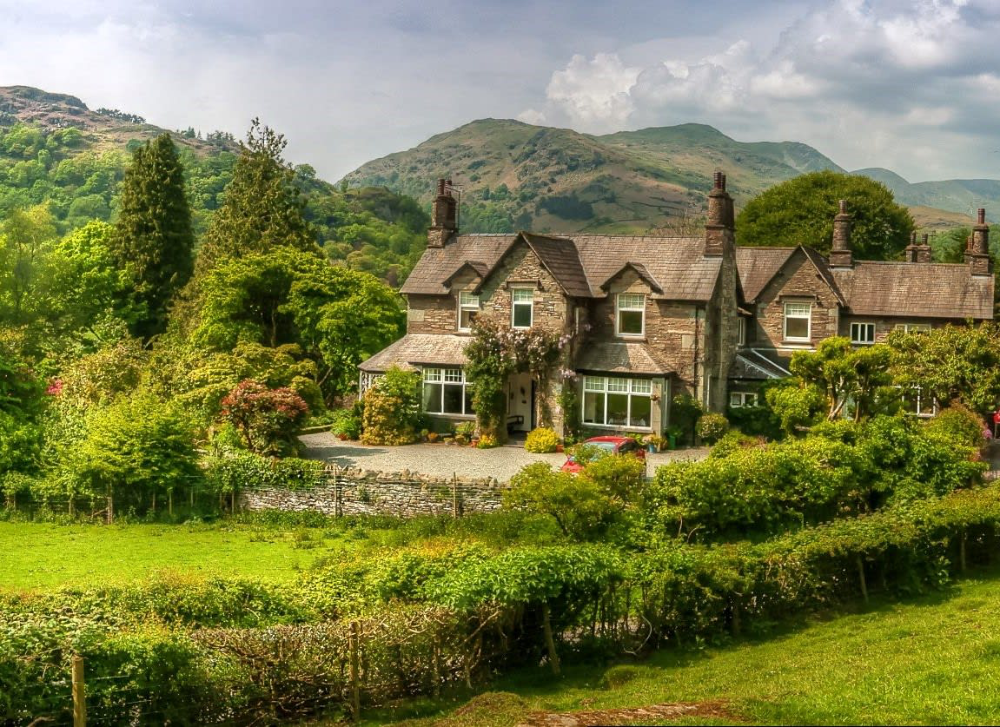

In [5]:
imshow(field)

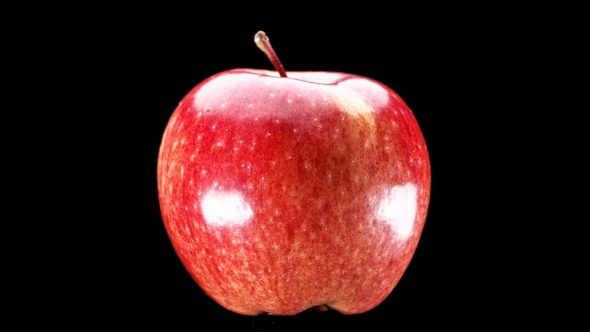

In [6]:
imshow(apple)

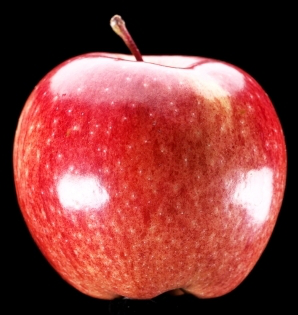

In [7]:
img = apple
positions = np.nonzero(img)

top = positions[0].min()
bottom = positions[0].max()
left = positions[1].min()
right = positions[1].max()

apple = apple[top:bottom,left:right,:]
imshow(apple)

In [8]:
def brightness_matrix(image):
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    return gray/255

In [9]:
#integrate image2 in image1
def combine(im1, im2, light_apple, kernel=(10,10)):

    shape = im1.shape
    
    gray = cv.cvtColor(im2, cv.COLOR_BGR2GRAY)
    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY)[1]

    kernel = np.ones(kernel, np.uint8)
    thresh = cv.erode(thresh, kernel, iterations=1)

    mask = cv.resize(thresh, (im1.shape[1], im1.shape[0])).astype(bool)
    
    im2 = cv.resize(im2, (im1.shape[1], im1.shape[0]))
    light_apple = cv.resize(light_apple, (im1.shape[1], im1.shape[0]))

    brightness = brightness_matrix(im1).max()
    dimed_im2 = np.dstack(
        (im2[:, :, 0] * brightness, im2[:, :, 1] * brightness,
         im2[:, :, 2] * brightness)).astype(np.uint8)

    final_image = np.zeros(shape)
    for k in range(final_image.shape[2]):
        for i in range(final_image.shape[0]):
            for j in range(final_image.shape[1]):
                if not mask[i, j]: final_image[i, j, k] = im1[i, j, k]
                else: final_image[i, j, k] = light_apple[i, j, k]

    final_image = final_image.astype(np.uint8)

    return final_image

In [10]:
import random


def extract(im, size,coord=None):
    if not len(size) == 2: raise Exception(size, "must be of len=2")
    _shape = im.shape
    if _shape[0] < size[0] or _shape[1] < size[1]:
        raise Exception("Square to big for image : ", _shape[:-1], size)
    
    im = im.copy()
    x_max,y_max = _shape[0]-size[0], _shape[1]-size[1]
    
    if coord is None : x_start,y_start = random.randint(0,x_max+1),random.randint(0,y_max+1)
    else : x_start,y_start = coord
    x_end,y_end = x_start+size[0],y_start+size[1]
    
    return im[x_start:x_end,y_start:y_end,:],(x_start,x_end),(y_start,y_end)

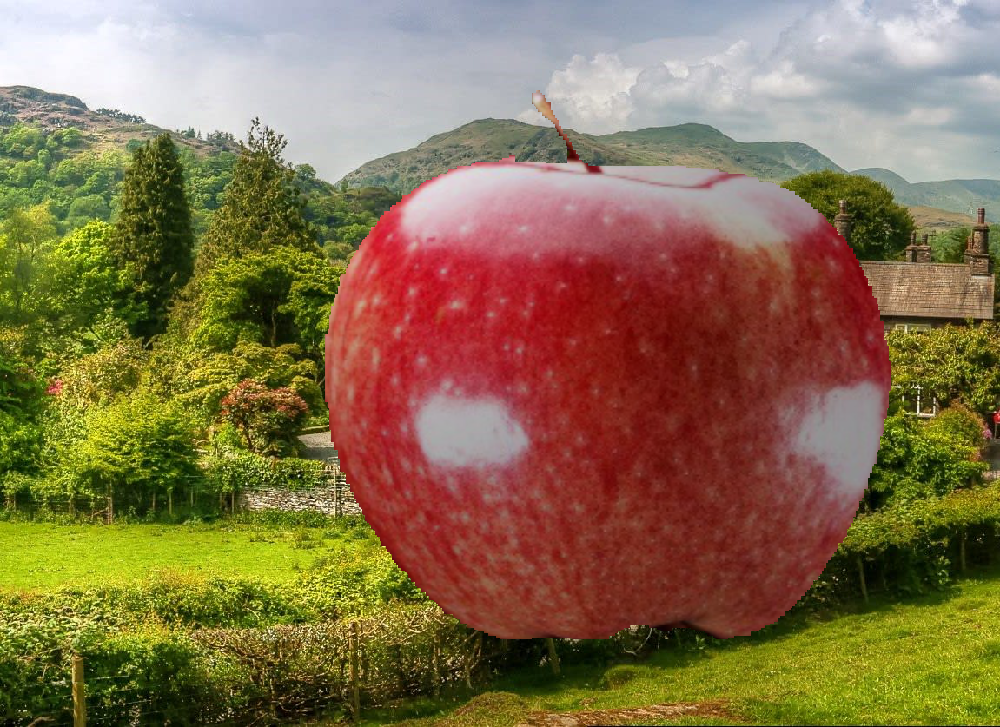

In [11]:
sel_field = field.copy()
size = random.randint(10,min(sel_field.shape[:-1]))
square,x,y = extract(sel_field, (size,size))
square = combine(square,apple,light_apple)
sel_field[x[0]:x[1],y[0]:y[1],:] = square
imshow(sel_field)

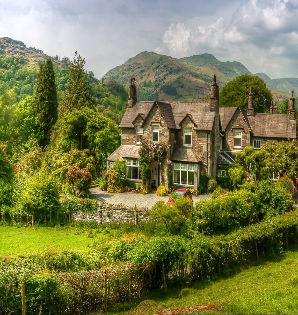

In [12]:
lil_field = cv.resize(field.copy(),(apple.shape[1],apple.shape[0]))
lil_apple = apple.copy()
imshow(lil_field)

In [13]:
def adjust_contrast(im1,im2,kernel=None):
    brightness = brightness_matrix(im1)        
    x_max,y_max,_ = im1.shape
    if kernel is None:
        _min = np.min(brightness)
        _max = np.max(brightness)
        contrast = (_max-_min)/(_max+_min)
        return contrast * np.ones((x_max,y_max))
    
    
    x_step,y_step = kernel
    contrast = np.zeros((x_max,y_max))
    
    for y in range(y_max)[::y_step]:
        for x in range(x_max)[::x_step]:
            pixels = brightness[x:x+x_step,y:y+y_step]
            _min = np.min(pixels)
            _max = np.max(pixels)
            if _max==0 and _min==0 : local_contrast=1
            else :local_contrast = (_max-_min)/(_max+_min)
            
            contrast[x:x+x_step,y:y+y_step] = local_contrast
                

    return contrast

In [14]:
def adjust_brightness(im1,im2,kernel=None):
    brightness1 = brightness_matrix(im1)
    brightness2 = brightness_matrix(im2)
    x_max,y_max,_ = im1.shape
    if kernel is None: return brightness2 - brightness1
    
    x_step,y_step = kernel
    light = np.zeros((x_max,y_max))
    
    for y in range(y_max)[::y_step]:
        for x in range(x_max)[::x_step]:
            pixels = brightness1[x:x+x_step,y:y+y_step]
            light[x:x+x_step,y:y+y_step] = np.mean(brightness2[x:x+x_step,y:y+y_step]) - np.mean(pixels)
                

    return light

In [15]:
#integrate image2 in image1
def combinev2(im1, im2,kernel=(10,10)):

    shape = im1.shape
    
    gray = cv.cvtColor(im2, cv.COLOR_BGR2GRAY)
    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY)[1]
    kernel = np.ones(kernel, np.uint8)
    thresh = cv.erode(thresh, kernel, iterations=1)
    mask = cv.resize(thresh, (im1.shape[1], im1.shape[0])).astype(bool)
    
    im2 = cv.resize(im2, (im1.shape[1], im1.shape[0]))

    brightness = adjust_brightness(im1,im2,(10,10))
    contrast = adjust_contrast(im1,im2,(10,10))
    im2 = channel_operand(im2,contrast,"mult")
    im2 = channel_operand(im2,brightness,"add").astype(np.uint8)
    im2 = cv.GaussianBlur(im2,(11,11),0)
    
    final_image = np.zeros(shape)
    for k in range(final_image.shape[2]):
        for i in range(final_image.shape[0]):
            for j in range(final_image.shape[1]):
                if not mask[i, j]: final_image[i, j, k] = im1[i, j, k]
                else: final_image[i, j, k] = im2[i, j, k]

    final_image = final_image.astype(np.uint8)

    return final_image

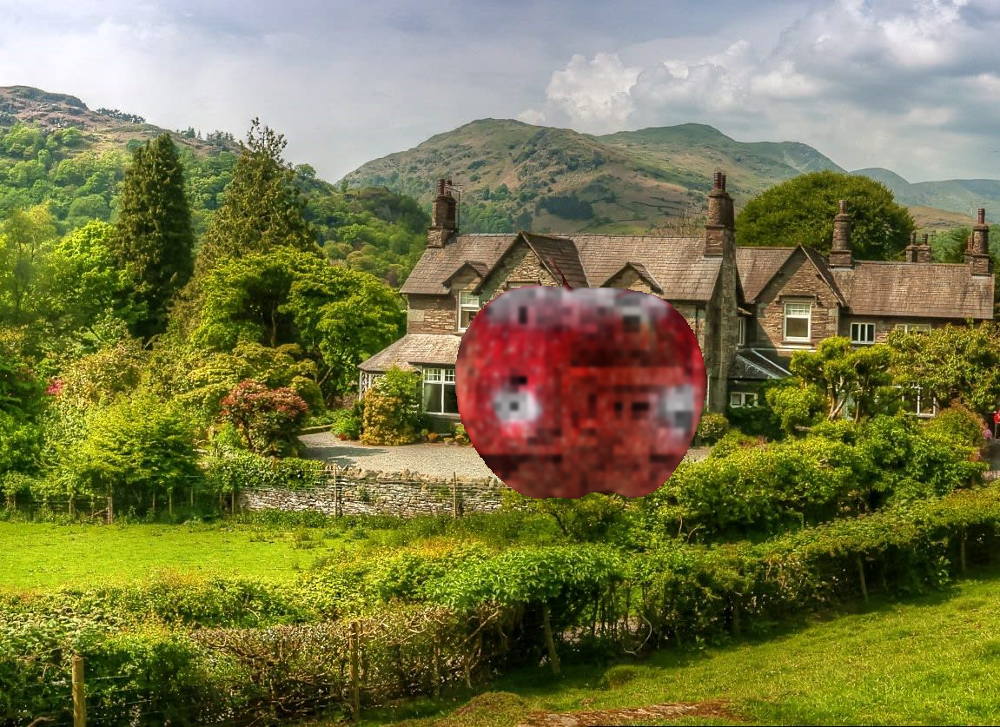

In [16]:
sel_field = field.copy()
size = random.randint(10,min(sel_field.shape[:-1]))
square,x,y = extract(sel_field, (size,size))
square = combinev2(square,apple)
sel_field[x[0]:x[1],y[0]:y[1],:] = square
imshow(sel_field)

incrust apple using depth

In [17]:
from depth_model import depth_model
model = depth_model()

In [18]:
image = cv.imread("./landscape/mansion.jpg")
model.load_image("./landscape/mansion.jpg")
image.shape

(837, 1151, 3)

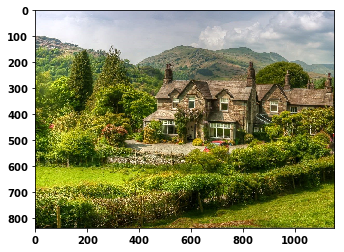

In [19]:
model.show_image()

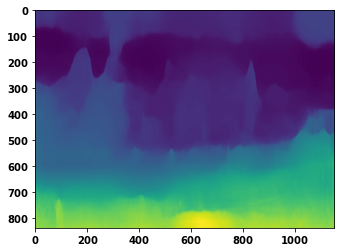

In [20]:
model.show_imap()

In [21]:
model.get_imap().shape

(837, 1151)

Starting extraction


  0%|          | 0/4 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

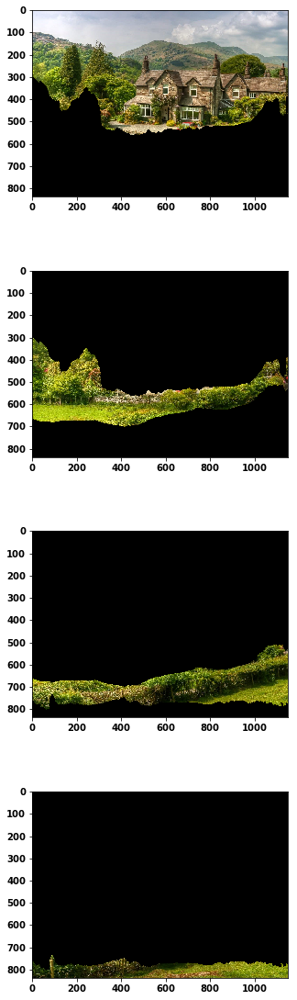

In [22]:
depth = model.extract_depth(4)

plt.figure()

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(len(depth),1,figsize=(5,20)) 

for i in range(len(depth)):axarr[i].imshow(depth[i])

plt.show()

In [23]:
image = model.get_image()
new_image = np.zeros(image.shape)
assert new_image.shape == image.shape

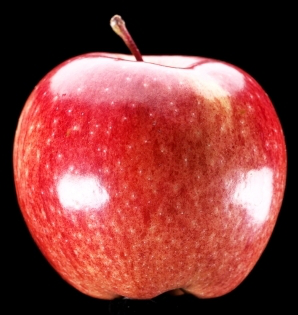

In [24]:
imshow(apple)

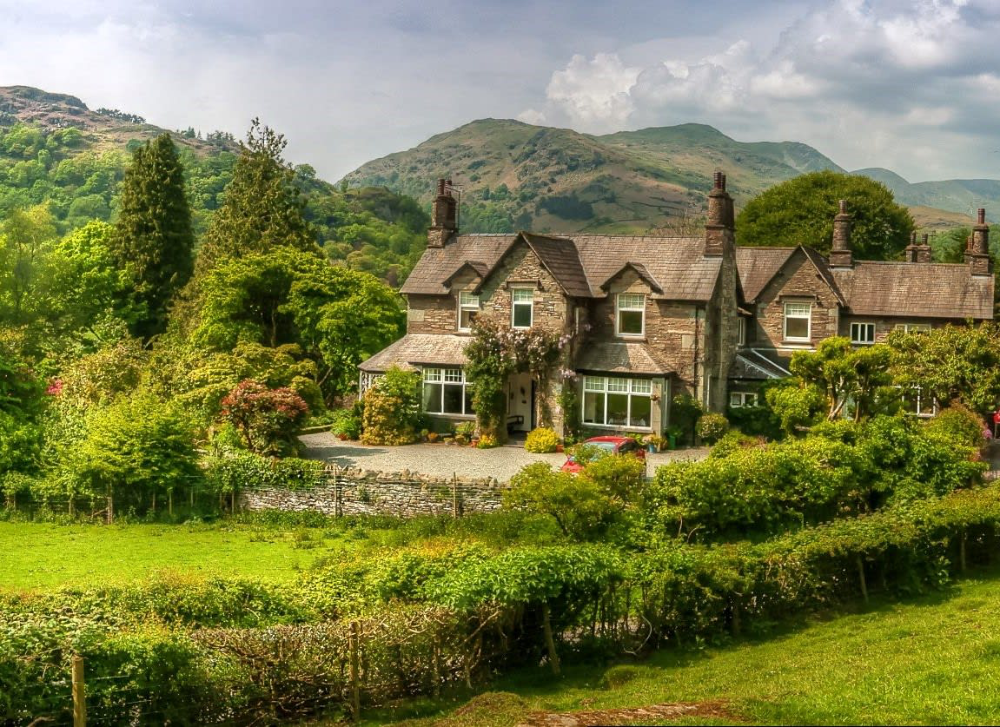

In [25]:
imshow(field)

In [26]:
im1 = field.copy()
im2 = apple.copy()[:,:,::-1]

In [27]:
def add_non_black(im1,im2):
    base = im1.copy()
    _2add = im2.copy()

    x,y,_ = base.shape
    for i in range(x):
        for j in range(y):
            if not tuple(_2add[i][j]) == (0,0,0): base[i][j] = _2add[i][j]
    return base.astype(np.uint8)

In [28]:
tmp = combinev2(depth[1],im2)
Image.fromarray(tmp).show()

In [29]:
nb_depth = 7
depth = model.extract_depth(nb_depth)

for where in tqdm(range(nb_depth)):
    depth[where] = combine(depth[where],np.asarray(im2),np.asarray(im2))
    final = np.zeros(im1.shape)
    for image in tqdm(depth):
        final = add_non_black(final,image)
        
    im = Image.fromarray(final)
    im.save("./result/"+str(where)+".jpg")

Starting extraction


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

In [30]:
loc = depth[3]
gray = cv.cvtColor(loc, cv.COLOR_BGR2GRAY)
gray.nonzero()

(array([ 54,  54,  54, ..., 789, 789, 789], dtype=int64),
 array([447, 448, 449, ..., 574, 575, 576], dtype=int64))

In [31]:
gray[54][447]

109

(491, 353)
0.13333333333333333


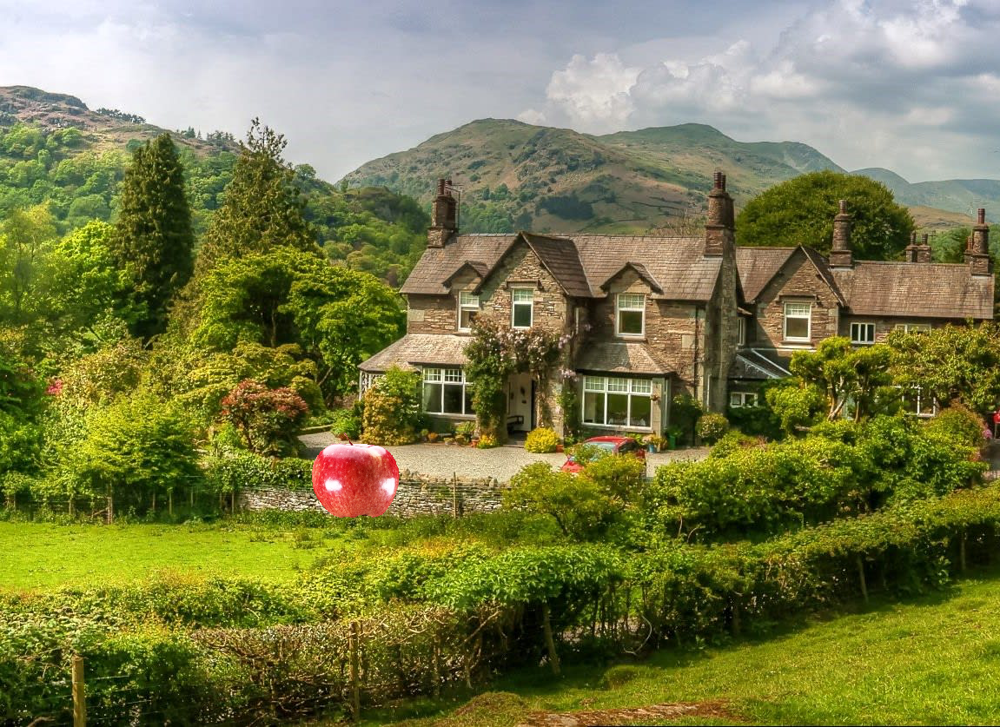

In [32]:
sel_field = field.copy()

point = (random.randint(0,500),random.randint(0,500))
de = model.get_imap()[point]/255
print(point)
print(de)

size = int(min(sel_field.shape[0:2]) * de)
square,x,y = extract(sel_field, (size,size),coord=point)

square = combine(square,apple,apple)

sel_field[x[0]:x[1],y[0]:y[1],:] = square
imshow(sel_field)